In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import make_lupton_rgb
from astropy import units as u

import artpop 
plt.style.use('jpg.mplstyle')

In [2]:
xy_dim = 501
phot_system ='LSST' 
pixel_scale = 0.2

mirror_diameter = 6.4 * u.m
mu_sky_vals = [19.9, 21.2, 22.0] # sky brightness 
exptimes = 3 * np.array([30, 15, 15]) * u.min # exposure times
seeing = [0.7] * 3

psf = {'irg'[i]: artpop.moffat_psf(seeing[i], pixel_scale) for i in range(3)}
imager = artpop.ArtImager(phot_system, mirror_diameter)

In [3]:
total_mass = 1e6

log_age = 8.5
feh = -1.5

r_eff = 0.55 * u.kpc
distance = 5.0 * u.Mpc

n = 0.8
theta = 45
ellip = 0.3

10.0


9.5


9.0


8.5


8.0


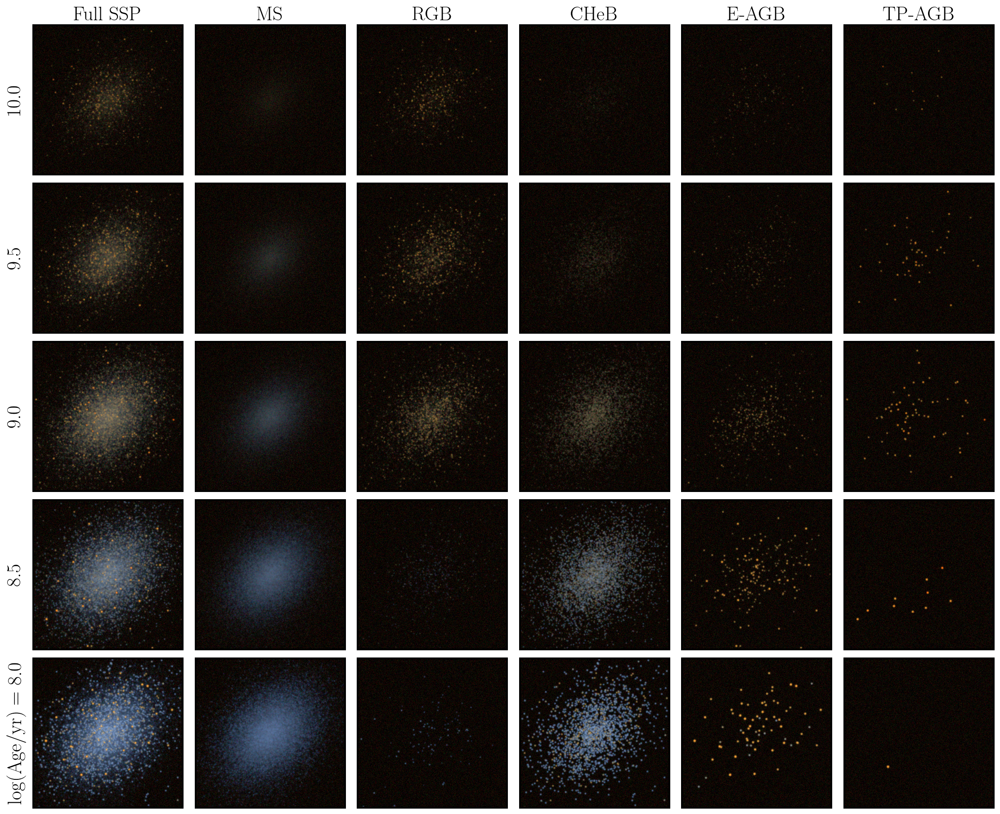

In [4]:
ages = np.arange(8, 10.5, 0.5)[::-1]

fig, axes = plt.subplots(len(ages), 6, figsize=(16 * 6./len(ages), 16), 
                         subplot_kw=dict(xticks=[], yticks=[]))
fig.subplots_adjust(wspace=0.06, hspace=0.06)


fs = 22

Q = 8
stretch = 0.25
phases = ['all', 'MS', 'RGB', 'CHeB', 'EAGB', 'TPAGB']
phase_labels = ['Full SSP', 'MS', 'RGB', 'CHeB', 'E-AGB', 'TP-AGB']

for i, log_age in enumerate(ages):
    print(log_age)

    src = artpop.MISTSersicSSP(log_age, feh, phot_system, 
                               r_eff, n, theta, ellip, distance, xy_dim, 
                               pixel_scale, total_mass=total_mass, label_type='phases')
    
    for j in range(6):
    
        if phases[j] != 'all':
            mask = src.labels == phases[j]
        else:
            mask = None
            
        images = []
            
        for num, band in enumerate('irg'):
            obs = imager.observe(src, f'LSST_{band}', exptimes[num], psf=psf[band],
                                 sky_sb=mu_sky_vals[num], mask=mask)
            
            images.append(obs.image)

        rgb = make_lupton_rgb(*images, stretch=stretch, Q=Q)
    
        _, _ax = artpop.show_image(rgb, subplots=(fig, axes[i, j]), rasterized=True)
        
        if i==0:
            _ax.set_title(phase_labels[j], fontsize=fs)
        if j == 0:
            label = str(log_age) if i != 4 else r'$\log(\mathrm{Age/yr}) = $ ' + str(log_age)
            axes[i, j].text(-0.18, 0.5, label, va='center', 
                            transform=axes[i, j].transAxes, rotation=90, fontsize=22)